# ECS7020P mini-project submission

The mini-project consists of two components:


1.   **Basic solution** [6 marks]: Using the MLEnd Hums and Whistles dataset, build a machine learning pipeline that takes as an input a Potter or a StarWars audio segment and predicts its song label (either Harry or StarWars).
2.   **Advanced solution** [10 marks]: There are two options. (i) Formulate a machine learning problem that can be attempted using the MLEnd Hums and Whistles dataset and build a solution model. (ii) Create a product that uses the functionality provided by a model trained on the MLEnd Hums and Whistles dataset (e.g. a simple App that predicts the label Harry or StarWars when you hum to it).  

The submission will consist of two Jupyter notebooks, one for the basic solution and another one for advanced solution. Please **name each notebook**:

* ECS7020P_miniproject_basic.ipynb
* ECS7020P_miniproject_advanced.ipynb

then **zipped and submitted toghether**.

Each uploaded notebook should consist of: 

*   **Text cells**, describing concisely each step and results.
*   **Code cells**, implementing each step.
*   **Output cells**, i.e. the output from each code cell.

and **should have the structure** indicated below. Notebooks will not be run, please make sure that the output cells are saved.

How will we evaluate your submission?

*   Conciseness in your writing (10%).
*   Correctness in your methodology (30%).
*   Correctness in your analysis and conclusions (30%).
*   Completeness (10%).
*   Originality (10%).
*   Efforts to try something new (10%).

Suggestion: Why don't you use **GitHub** to manage your project? GitHub can be used as a presentation card that showcases what you have done and gives evidence of your data science skills, knowledge and experience. 

Each notebook should be structured into the following 9 sections:


# Environment Setup

This section sets up *most* of the necesary library imports for this project - however there are some more throughout this notebook.

In [ ]:
# Mount our google drive, where the data will be stored
from google.colab import drive
drive.mount('/content/drive')

# Various math/ml libraries
import numpy as np
import pandas as pd
import random

pd.options.mode.chained_assignment = None
import matplotlib.pyplot as plt
from sklearn import metrics

# Manage and download the data
import os, sys, re, pickle, glob
import urllib.request
import zipfile

# Managing our audio data
import IPython.display as ipd
from tqdm import tqdm
import librosa
import librosa.display

Mounted at /content/drive


# 1 Author

**Student Name**: Mark James Dunbar
 
**Student ID**:  210013360



# 2 Problem formulation

### The Problem - Classifying 2 Different Songs

This notebook will explore the use of machine learning to correctly classify 15-second audio clips, gathered from students on the 2021 _Principles of Machine Learning_ course. These clips can be interpreted as either a 'hum' or a 'whistle' of the same 15-second segment of a popular theme song. The basic problem we will tackle will involve correctly classifying these clips into one of two classes;


1. Harry Potter Theme
2. Star Wars Impreial March

We'll be comparing 3 different models which we will detail later on in this notebook. The final outcome of each of the experiments run in this notebook will be a pipeline that takes `.wav` filepath inputs, extracts an array of the features for the data, and produces an array of predictor labels as an output.

### What's so interesting about this?

This project gives insight into some basic features we can use to classify different rythms of songs, based on the features we choose to classify each song. Furthermore, this project explores the methods used to choose the best parameters for models, compares the effectiveness of each model for this application, and explores the effect different types of audio inputs (hums or whistles) can affect the outcome of the model's prediction.

# 3 Machine Learning pipelines

### Constructed Pipelines
We will be constructing one pipeline for each experiment we carry out in the results section, with the model we have deemed the "most suitable" based on the training data we provide each model. The final pipelines we have after comparing each ML will be displayed in the results section as python functions that take in a list of .wav filepaths, and return their predicted labels.

### Input
The input for this ML pipeline will be a list of `.wav` filepaths, containing the filepath locations of our audiclips (`.wav files`). Each `.wav` file is a 15 second audio clip - either *hums* or *whistles* - of a specified *song*. The name of the *song* and the interpretation type (*hum* or *whistle*) will be specified in the file name.

In order to solve the problem proposed, we will first have to clean the data. An algorithm that standardises the input file names will be implemented, so that files and their songnames, interpretation type, and attempt number can be resolved from the filename. 

### Intermediate Stages

Next, we will look at ways to extract features from each soundclip. This will be done by creating different functions for extracing the desired features from our machine learning pipeline's input data, and returning the features as input for our machine learning models.

These features will be normalised using the z-score method, and in some cases (some experiments) outliers will be removed in a process which removes outliers with z-scores above a given threshold. This process will be explained in detail further on.

After these steps, the data is passed to the model evaluation step, where grid search k-fold cross-validation is used to test 3 different models, and different hyperparameters for each model. From this k-fold cross validation stage, the most suitable models are presented for each of our model types, based on their accuracies in the gridsearch stage. We will further select the best overall model to continue using in our pipeline for that particular experiment.


### Output

The output of our pipeline will be the predicted labels for the input data, given as a vector $y$. This will represent the predictions made by the model our pipeline chose to run the data over.

# 4 Transformation stage

## 4.1 - Attributes/Features

Below are the data transformation algorithms we'll be using to extract 3 main sets of features;

1. peaks - identified time locations of amplitude peaks in each audioclip. We can think of these as "notes" in the song.
2. tempo - the librosa package allows for the extraction of a predicted tempo for the waveform, based on the "peaks" present in the audioclip.
3. avg_peaktopeak_distance - the average distance (in time) between "peaks".

The cell below shows how the time locations of "peaks" - which can be interpreted as "notes" in our audio files can be extracted using librosa, as well as the average distance betweek the peaks, and the tempo of the audioclip. We extract the features "average distance between peaks", and the first 15 peak positions (times) in the audio clip. The theory behind this (see peaks references in the final section) is that songs will have different peak locations depending on when the notes in the song occur, and we can use these features to identify unique rhythm patterns for each class of song in the audio clips.

In [ ]:
def getPeaks(x,fs):
  
  hop_length = 256
  onset_envelope = librosa.onset.onset_strength(x, sr=fs, hop_length=hop_length)  

  N = len(x)
  T = N/float(fs)
  t = np.linspace(0, T, len(onset_envelope))

  tempo = librosa.beat.tempo(onset_envelope=onset_envelope, sr=fs)
  tempo 

  onset_frames = librosa.util.peak_pick(onset_envelope, 7, 7, 7, 7, 0.5, 5)
  onsets = onset_frames[:15]

  return onsets.tolist(), tempo.tolist()

The last cell shown here is a function that gets the features as a 1D array for each audio clip, and returns our feature vector $X$ - containing the features for that audio clip, and $y$ - the labels vector for that audioclip. we see that $y$ is given the name of the audioclip file.

In [ ]:
def getXyFeatures(files,labels_file, scale_audio=False, onlySingleDigit=False):
  bad_files = []
  X,y =[],[]

  # For test purposes - test the feature extraction on 20 files
  # files = files[:20]

  for file_index, file in enumerate(tqdm(files)):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]

    # Produce the label of this audio clip based on it's file name
    if labels_file.loc[fileID]['song']=='potter':
      yi = 'potter'
    elif labels_file.loc[fileID]['song']=='starwars':
      yi = 'starwars'

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    peaks, tempo = getPeaks(x, fs)


    if len(peaks) < 15:
      bad_files.append(file_index)
    else:
      peaks = peaks[:15]
      peak_distances = []

      for i, val in enumerate(peaks):
        if i > 1:
          distance = peaks[i] - peaks[i-1]
          peak_distances.append(distance)

      avg_peaktopeak_distance = sum(peak_distances) / len(peak_distances)

      xi = [avg_peaktopeak_distance] + peaks + tempo
      X.append(xi)
      y.append(yi)
  return np.array(X),np.array(y), bad_files

For our final pipelines to work, we must create a function similar to getXyFeatures, that simply returns the features of a given audio clip, and not the labels vectory $y$:

In [ ]:
def getXFeatures(files, scale_audio=True, onlySingleDigit=True):
  bad_files = []
  X = []

  # For test purposes - test the feature extraction on 20 files
  # files = files[:20]

  for file_index, file in enumerate(tqdm(files)):
    fileID = file.split('/')[-1]
    file_name = file.split('/')[-1]

    fs = None # if None, fs would be 22050
    x, fs = librosa.load(file,sr=fs)
    if scale_audio: x = x/np.max(np.abs(x))
    peaks, tempo = getPeaks(x, fs)

    if len(peaks) < 15:
      bad_files.append(file_index)
    else:
      peaks = peaks[:15]
      peak_distances = []

      for i, val in enumerate(peaks):
        if i > 1:
          distance = peaks[i] - peaks[i-1]
          peak_distances.append(distance)

      avg_peaktopeak_distance = sum(peak_distances) / len(peak_distances)

      xi = [avg_peaktopeak_distance] + peaks + tempo
      X.append(xi)
  return np.array(X), bad_files

# 5 Modelling

## 5.1 SVM (support vector machine)

Support Vector Machines, or SVMs are machine learning algorithms that find an $N$-dimensional hyperplane that separates $N$-distinct features into two different classes. In the case of our data, $N$ will be the number of features that we decide to extract. The support vectors produced in this model are formed of data points close to the hyperplane that influence the characteristics of the hyperplane.

One hyperparameter for the SVM used in this notebook, the cost parameter, `C` will be chosen in the following experiments. This hyperparameter allows the hyperplane to 'bend' towards datapoint - i.e. it determines how flexible the hyperplane can be. For a low cost parameter, the svm algorithm will produce a more rigid decision surface. As the value of `C` increases, so too does the risk of overfitting, where the decision surface will strive to fit 100% of the training data at the cost of the svm's accuracy on unseen data. [Reference here](https://stats.stackexchange.com/questions/225409/what-does-the-cost-c-parameter-mean-in-svm)

The SVM we will use comes from the sklearn python module, and an example of how it can be implemented is shown below.



```
from sklearn import svm

# This is just an example of how our model will look in the pipeline

# This step defines the model
# C is our hyperparameter - the cost.
SVM = svm.SVC(C)

# This step trains our model using the training data
SVM.fit(X_train,y_train)

# This step uses our trained model to predict y, given validation X
svm_predictions = SVM.predict(X_val)
```



## 5.2 KNN (k-nearest neighbours) Model

K-nearest neighbour (KNN) classifier algorithms assume that similar data points are likely to be closer together based on their features. Although there are likely to be more than 2 features used in the KNN models used in this project, KNN is best described in a 2-dimensional (2-feature) space. In terms of our 2-class problem, the model will create 2 clusters based on the features we provide, that represent one of the two classes - the song's name.

A KNN model will classify a new observation $x$ with label $y$ if the majority of the $K$ closest (nearest) neighbouring points of $x$ in the dataset belong to class $y$. [From data mining, lesson 6.] As shown below, the number of nearest neighbours to consider, `k`, is the main hyperparameter for the sklearn KNeighboutrClassifier model.

As the data points are measured based on their *euclidian distance*, which is a dimensionless measurement of the distance between the points, this machine learning algorithm is suceptible to bias from features that have not been normalised, therefore standardising features with a method such as z-score normalisation is essential.

One advantage KNN has over the other two models tested in this project is that KNN models do not require training sets. This allows the model to skip the train-test split phase as well as the model training step required by the other two models, generating predictions very quickly. If the accuracy of the KNN model and other models are very similar, KNN may be preferable as it is much less computationally taxing than the other two models.

The KNN classifier we will use comes from the sklearn python module, and an example of how we will use it is shown below.



```
from sklearn.neighbors import KNeighborsClassifier

# This is just an example of how our model will look in the pipeline

# This step defines the model
# k is our hyperparameter - the number of nearest neighbours required to classify a new observation
KNN = KNeighborsClassifier(k)

# This step trains our model using the training data
KNN.fit(X_train, y_train)

# This step uses our trained model to predict y, given validation X
knn_predictions = KNN.predict(X_val)
```



## 5.3 Logistic Regression Model

Logistic regression (LR) classifiers are used to classify binary-class data (i.e. a song is: potter $TRUE$ or starwars $FALSE$ ). 

This classifier is statistical in nature, and calculates the probability of a data point belonging to one of either two classes based on it's features (i.e. is potter - $TRUE$ / is not potter - $FALSE$).

The LR machine learning algorithm uses many hyperparameters, but for the sake of simplicity this project will evaluate and choose the best penalty strength hyperparameter, `C` by comparing different values for this hyperparameter. The penalty hyperparameter penalises the logistic regression algorithm for having too many coefficients in it's algorithm, by reducing the less 'influential' coefficients of the logistical function to 0.

The Logistic Regression machine we will use comes from the sklearn python module, and an example of how we will use it is shown below.



```
from sklearn.linear_model import LogisticRegression

# This is just an example of how our model will look in the pipeline

# This step defines the model
# solver is our hyperparameter - the number of nearest neighbours required to classify a new observation
LR = LogisticRegression(solver)

# This step trains our model using the training data
LR.fit(X_train, y_train)

# This step uses our trained model to predict y, given validation X
lr_predictions = LR.predict(X_val)
```



# 6 Methodology

## Experimentation phase
### Test datasets
Before we construct our final pipelines, 3 sets of data will be used as input for testing our pipeline - the features extracted from both Hums and Whistles, Hum files only and Whistles files only. The extracted features will be two numpy arrays; $X$, the extracted feature values, and $y$, the TRUE labels provided by the filenames.

In total, 3 experiments will be performed each with 2 parts for each type of data input;
* Hums and whistles
* Hums only
* Whistles only

For each set of data, we will experiment with:

(a) simply standardising feature values using thier z-scores                                                                     
(b) removing outliers using their z-scores.

Our experiments will all involve comparing the 3 models detailed in section 5, by splitting the input data (arrays $X$ and $y$) into training and validation sets. Throughout each experiment, the split will use 70% of the data for training, and 30% for validating. The training sets will be used to train our models. 

In each experiment, the best hyperparameters for our models, discussed in section 5 will be selected by using gridsearch cross validation on our models, with a list of different parameters to try. 

### Gridsearch hyperparameter optimisation

Gridsearch cross validation iterates through each hyperparameter to evaluate, performing k-fold cross validation each time. In the following experiments, a fold value of 5 is always chosen. 

Gridsearch cross validation splits the data passed to it into k folds of equally sized data sets. It will then use 4 of the 5 folds to train the current model and its hyperparameter, and 1 fold to calculate a validation accuracy. This step is repeated, each time using a different fold for the validation step. The mean accuracy is then calculated for all 5 iterations.

When the gridsearch has calculated all mean accuracies for every hyperparameter, the model and hyperparameter combo with the highest mean validation is returned as the 'best' model.

*Note that we will pass the gridsearch function our training dataset, which will then be split into separate  k-fold cross validationtrain-validate sets.*

#### Model Comparison
Once we have optimised the hyperparameters for each of our 3 models, we will compare them by training them on our training data, and then producing predictions for our validation data. The model with the highest validation accuracy will be used in the construction of our final pipeline.


## Pipeline construction phase

Our pipelines will consist of the following stages

**Input ---> Data transformation (Feature extraction)---> Normalise (zscore) ---> Remove Outliers (zscore threshold) ---> Model Prediction ---> Output**

Let's see what's happening at each stage, so we can easily follow the process:

1.   Input - at the input stage, we feed our raw data to out pipeline. In our case, the input is a list containing the filepaths to each audio file. 
   
2.   Data Transformation - the input files are opened in librosa, and the features for each file are extracted as an array of features.

3.   Normalise - the features are normalised so that the model is not biased towards one feature more than the other.

4.   Remove Outliers - Not present in all of our experiments, this step would remove any audioclip that contains a feature with a z-score greater than the threshold specified. 

5. Model Prediction - the trained model we have is used to predict the labels for the song files based on their extracted features.

6.   Output - The prediction labels for each song is returned.

The reslutant pipelines from each experiment is constructed in the "Results" section.



## 6.2 Model Evaluation function

The following function integrates out gridsearch cross validation for each model, then returns a list, containing a list of the **best model**, its **training label predictions**, its **validation label predictions** and its **validation accuracy** for each of the models we are comparing.

In [ ]:
def testModels(X_train,X_val,y_train,y_val):  
  # SVM
  #############################
  print("\n Support Vector Machine")
  print("==========================")

  # Once the method GridSearchCV.fit is called, each possible combination of hyperparameters from each of the lists is evaluated using cross-validation.
  parameters = {'C': [1, 2, 3, 4, 5, 6, 7, 8]}

  SVM = svm.SVC()
  SVM_cv = GridSearchCV(SVM, parameters, cv=5)
  SVM_cv.fit(X_train, y_train)

  print('Best hyperparameter setting: {0}.'.format(SVM_cv.best_estimator_))
  print('Average training accuracy across folds of best hyperparameter setting: {0}.'.format(round(SVM_cv.best_score_),3))
  print('Test dataset accuracy of best hyperparameter setting: {0}.'.format(round(SVM_cv.score(X_val, y_val),3)))


  # Now we've chosen the best value for C, we can train fit our test data, then
  SVM = SVM_cv.best_estimator_
  SVM.fit(X_train,y_train)

  # SVM Predictions
  svm_yt_p = SVM.predict(X_train)
  svm_yv_p = SVM.predict(X_val)

  # SVM Score
  print("SVM Score (Validation Accuracy): ",round(SVM.score(X_val, y_val),3))

  # Record our SVM model and predictions
  SVM_outputs = [SVM, svm_yt_p, svm_yv_p, SVM.score(X_val, y_val)]

  # KNN
  #############################
  print("\n K Nearest Neighbours")
  print("==========================")

  # Once the method GridSearchCV.fit is called, each possible combination of hyperparameters from each of the lists is evaluated using cross-validation.
  parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9]}

  KNN = KNeighborsClassifier()
  KNN_cv = GridSearchCV(KNN, parameters, cv=5)
  KNN_cv.fit(X_train, y_train)

  print('Best hyperparameter setting: {0}.'.format(KNN_cv.best_estimator_))
  print('Average training accuracy across folds of best hyperparameter setting: {0}.'.format(round(KNN_cv.best_score_,3)))
  print('Test dataset accuracy of best hyperparameter setting: {0}.'.format(round(KNN_cv.score(X_val, y_val),3)))

  KNN = KNN_cv.best_estimator_
  KNN.fit(X_train,y_train)

  knn_yt_p = KNN.predict(X_train)
  knn_yv_p = KNN.predict(X_val)

  # KNN Score
  print("KNN Score (Validation Accuracy): ", round(KNN.score(X_val, y_val),3))

  # Record our KNN model and predictions
  KNN_outputs = [KNN, knn_yt_p, knn_yv_p, KNN.score(X_val, y_val)]


  # LR
  #############################
  print("\n Logistic Regression")
  print("==========================")

  parameters = {'C': [100, 10, 1.0, 0.1, 0.01]}


  LR = LogisticRegression()
  LR_cv = GridSearchCV(LR, parameters, cv=5)
  LR_cv.fit(X_train, y_train)

  print('Best hyperparameter setting: {0}.'.format(LR_cv.best_estimator_))
  print('Average training accuracy across folds of best hyperparameter setting: {0}.'.format(round(LR_cv.best_score_,3)))
  print('Test dataset accuracy of best hyperparameter setting: {0}.'.format(round(LR_cv.score(X_val, y_val),3)))

  LR = LR_cv.best_estimator_
  LR.fit(X_train,y_train)

  lr_yt_p = LR.predict(X_train)
  lr_yv_p = LR.predict(X_val)

  # LR Score
  print("LR Score (Validation Accuracy): ",round(LR.score(X_val, y_val),3))

  # Record our LR model and predictions
  LR_outputs = [LR, lr_yt_p, lr_yv_p, LR.score(X_val, y_val)]

  return SVM_outputs, KNN_outputs, LR_outputs

## 6.2 Model Train/Test Accuracy

Below is a function that will return both the validation and training accuracies of a model based on it's predicted train/validate labels and it's train/validate TRUE labels.

In [ ]:
def getModelAccuracies(yt_p, yv_p, y_train, y_val):

  ta = round(np.mean(yt_p==y_train),4)
  va = round(np.mean(yv_p==y_val),4)

  print('Training Accuracy', ta)
  print('Validation  Accuracy', va)

  return ta, va

## 6.3 Model Confusion Matrix

The code below produces a confusion matrix for the validation data predictions, taking the model's predicted labels and the true labels of the validation dataset.

In [ ]:
def getModelConfusionMatrix(yv_p, y_val):
  # Plotting the confusion matrix 
  cm_v = metrics.confusion_matrix(y_val, yv_p, labels=["potter", "starwars"])
  disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm_v,display_labels=["potter", "starwars"])
  disp.plot()
  plt.title("Validation Data Confusion Matrix")
  plt.show()

## 6.4 Z-score normalisation

The code below can be used to normalise our features. This will be used in our pipelines.


In [ ]:
def getZscores(X):
  mean = X.mean(0)
  sd =  X.std(0)
  X = (X-mean)/sd
  return(X)

## 6.5 Z-score Outlier Removal

The code below can remove data points (from any dataset passed to it) that have a z-score greater than the value of `zscore_threshold`. One can interpret the zscore value as "how many standard deviations away" a z-score value in a dataset is away from the mean z-scores value. For instance, a threshold value of 3 will removing any feature z-scores that are more than 3 standard deviations away from the mean z-score of that feature.

In [ ]:
def removeOutliers(X, y, zscore_threshold):
  # Standardisation (z-score normalisation)
  mean = X.mean(0)
  sd =  X.std(0)
  X = (X-mean)/sd
  X = X.tolist()

  X_outliers_removed = []
  y_outliers_removed = []
  outliers = []

  for i, z_scores in enumerate(X):
    # If none of the features in X are outlier values (i.e. they are less than our threshold), append the features to our new X
    if all(score < zscore_threshold for score in z_scores):
      X_outliers_removed.append(z_scores)
      y_outliers_removed.append(y[i])
    else:
      # Keep track of our outlier values
      outliers.append(z_scores) 
  # Print the number of data points removed
  print(len(outliers), " outliers removed.")   

  # Return new arrays for X and y with the outliers removed
  return np.array(X_outliers_removed), np.array(y_outliers_removed)


# 7 Dataset

### 7.1 Obtaining and loading our data

In this section, we'll show and discuss the code used to extract our data from the source download links.

The following URLs are links to the datasets that we will be working on. These are the URLs for the Harry Potter and Star Wars hum and whistle datasets - each split into two `.zip` files. We will consider the filepaths of the extracted audio clips from these `.zip` files the input for our pipeline.


1.   https://collect.qmul.ac.uk/down?t=6122TDAA73VPCMDQ/5DSHD27BLQMK5S8E1HLG19O
2.   https://collect.qmul.ac.uk/down?t=4LV64IN5OK5E35NN/4H6DJTRS7KVD704UG2CN0IG
3.   https://collect.qmul.ac.uk/down?t=650T7K3FAE26MB29/592IN2FALUM43SGC35O0580
4.   https://collect.qmul.ac.uk/down?t=6L5DHHRODAMK82R8/4512VDDUEFGBAPK0S82ENGO

By creating a dictionary for each of these files, we can store the download links, as well as the name of the zip-files they are related to






In [ ]:
# This method allows for multiple URLs to be used if required.
urls = {"Potter_1": "https://collect.qmul.ac.uk/down?t=6122TDAA73VPCMDQ/5DSHD27BLQMK5S8E1HLG19O", "Potter_2": "https://collect.qmul.ac.uk/down?t=4LV64IN5OK5E35NN/4H6DJTRS7KVD704UG2CN0IG", "StarWars_1": "https://collect.qmul.ac.uk/down?t=650T7K3FAE26MB29/592IN2FALUM43SGC35O0580", "StarWars_2": "https://collect.qmul.ac.uk/down?t=6L5DHHRODAMK82R8/4512VDDUEFGBAPK0S82ENGO" }

Before we begin to download our dataset, we will first define a function that will allow us to download the dataset from each URL to our drive.

In [ ]:
def download_url(url, save_path):
    with urllib.request.urlopen(url) as dl_file:
        with open(save_path, 'wb') as out_file:
            out_file.write(dl_file.read())

Here, we will download the files. If the datasets exist already, it will not repeat the download step. This saves us time when running the notebook multiple times. If we want a fresh download, we can manually delete the files inside the `MLENDHW` folder on our google drive.

In [ ]:
path = '/content/drive/MyDrive/Data/MLEndHW'
existing_files = os.listdir(path)

for key, value in urls.items():
  # Collect the samples.
  save_path = '{}/{}.zip'.format(path,key)
  # Don't download the dataset again if it's already there!! - This step just saves time.
  if os.path.exists(save_path):
    print("Files for {} already downloaded at {}".format(key, save_path))
    continue
  else:
    # Download the zip to the specified file path if it does not already exist.
    tqdm(download_url(value, save_path))
    print("{}.zip has been downloaded successfully at {}".format(key, save_path))

Files for Potter_1 already downloaded at /content/drive/MyDrive/Data/MLEndHW/Potter_1.zip
Files for Potter_2 already downloaded at /content/drive/MyDrive/Data/MLEndHW/Potter_2.zip
Files for StarWars_1 already downloaded at /content/drive/MyDrive/Data/MLEndHW/StarWars_1.zip
Files for StarWars_2 already downloaded at /content/drive/MyDrive/Data/MLEndHW/StarWars_2.zip


This next bit of code will extract the files. Again, to save time this code will only extract the files if they don't already exist in the `MLEndHW` folder in our google drive. We can run a fresh extract by manually deleting the extracted files.


In [ ]:
path = '/content/drive/MyDrive/Data/MLEndHW'
existing_files = os.listdir(path)
extract_files = {}

for key, value in urls.items(): 

  # Collect the samples, and check how many there are.
  save_path = '{}/{}.zip'.format(path,key)
  extracted_file_name = "{}_Extract".format(key)
  extraction_path = '{}/{}/'.format(path,extracted_file_name)
  sample_path = '{}*.wav'.format(extraction_path,key)

  if os.path.exists(extraction_path):
    print(save_path)
    print("Files for {} already extracted at {}".format(key, extraction_path))
  else:
    # Extract the zip files at a given location.
    print(save_path)
    with zipfile.ZipFile(save_path, 'r') as zip_ref:
      zip_ref.extractall(extraction_path)
    print("{} has been extracted successfully at {}".format(extracted_file_name, extraction_path))

  files = glob.glob(sample_path)
  extract_files[key] = files 

  print("This extract contains {} .wav files".format(len(files)))

/content/drive/MyDrive/Data/MLEndHW/Potter_1.zip
Files for Potter_1 already extracted at /content/drive/MyDrive/Data/MLEndHW/Potter_1_Extract/
This extract contains 206 .wav files
/content/drive/MyDrive/Data/MLEndHW/Potter_2.zip
Files for Potter_2 already extracted at /content/drive/MyDrive/Data/MLEndHW/Potter_2_Extract/
This extract contains 205 .wav files
/content/drive/MyDrive/Data/MLEndHW/StarWars_1.zip
Files for StarWars_1 already extracted at /content/drive/MyDrive/Data/MLEndHW/StarWars_1_Extract/
This extract contains 207 .wav files
/content/drive/MyDrive/Data/MLEndHW/StarWars_2.zip
Files for StarWars_2 already extracted at /content/drive/MyDrive/Data/MLEndHW/StarWars_2_Extract/
This extract contains 205 .wav files


Let's now merge the datasets we collected from the "Potter_1" and "Potter_2" zip files into one "potter" dataset. We will also do this for the "StarWars_1" and "StarWars_2" datasets. This gives us a dictionary containing the collective "potter" and "starwars" data.


In [ ]:
complete_datasets = {}

for key, data in extract_files.items():
  # Here, we're making the song names lowercase, just to standardize the names. 
  # Some names were all caps, random caps, or all lowercase. This is the first small bit of data cleaning we do.
  set_name = key.split('_')[0].lower()

  # Add datasets to one main dataset if it exists, or create a dataset if it does not already exist.
  if set_name in complete_datasets:
    complete_datasets[set_name] = complete_datasets[set_name] + data
  else:
    complete_datasets[set_name] = data

for song, data in complete_datasets.items():
  print("Dataset for \"{}\" contains {} files".format(song, len(complete_datasets[song])))


Dataset for "potter" contains 411 files
Dataset for "starwars" contains 412 files


### 7.2 Preprocessing the data

In this section, the code for cleaning our data and preparing it for the machine learning experiments is shown. As we downloaded multiple zip files separately, we will also combine our data into one large dataframe.

The eventual output of our preprocessing stage will be 3 sets of cleaned data:



**Hums and Whistles Combined**

With the output dataframe `MLENDHW_df`

And output list of files: `files`



**Hums only**

With the output dataframe `MLENDHW_df_hum`

And output list of files: `files_hum`



**Whistles only**

With the output dataframe `MLENDHW_df_whistle`

And output list of files: `files_whistle`

#### Data Cleaning

Now the fun bit; tidying up the filenames as much as possible. Note that as standard, all of the filenames were made lowercase during the previous section, where we combined all of the datasets for each song. This makes the filenames easier to work with. In this next preprocessing step, we:

*   Remove unwanted characters *(including unwanted spaces)* from filenames.

*   Check if the files have 4 descriptors _(i.e. student number, interpretation, attempt number, song name)_. If there are less than 4 file descriptors present, they are replaced with placeholders. If there are more than 4 file descriptors present, the extras will later be discarded.

*   We assume the first extracted file descriptors, the **student ID** to be correct - it's not relevant to us in this case anyway.

*   If the second extracted file descriptor is not the **interpretation** *(i.e. "hum" or "whistle")* we will scan the provided filename to check if it contains some or part of the string *"hum"* or *"whistle"*. Depending on whether it contains either of these, it will be assigned the matching **submission type** file descriptor.

*   If the third extracted file descriptor is not the **attempt number** of the submission *(i.e. "1", "2", "3" or "4")* we will scan the provided filename to check if it contains the string _"1", "2", "3"_ or _"4"_. If it contains any of these, it will be assigned the matching **attempt number** file descriptor. 

*   Lastly, if the fourth extracted file descriptor is not exactly **song name** of the submission *(i.e. "potter", "starwars")* we will scan the provided filename to check if it contains any part of the song name strings: _"potter" or _"starwars"_. If it contains any part of these, or any _misnomer_ in the dictionary we made, it will be assigned the matching **song name** descriptor.

*   Once all file descriptors are checked, we recombine the file descriptors into one string, for example:    

  `"s38" + "hum" + "2" + "potter"` produces the new filename `s38_hum_2_potter`

  The file is then renamed using this new, standardised format.

***NOTE***  

One major weakness of this method is that it assumes that the descriptors _song name_ and _interpretation_ are not mislabeled based on their contents - for example, if one assumes that a file with the `potter` descriptor does not instead contain the audio recording for `starwars`, or the audio recording for a `whistle` instead of a `hum`.

Errors like this could have a sizeable on model quality when we are training our models, as two recordings of the same label - which are mislabelled as two different classes could cause a poorer training and validation accuracy for the model.

In the results section, ways to remove any outliers in the training dataset *(e.g. a stray "hum" in a "whistle" dataset)* by analysing the features of the training data before it is used to train the model will be discussed.









In [ ]:
# We pass in the dictionary containing songnames (key) and lists of the filepaths (items)
def CleanFilenames(complete_datasets):  
  # We can use this string to specify what string characters we absolutely do not want in file names
  illegal_characters = "[] "

  # Since we have the benefit of knowing what song names we expect, we can build a dictionary of possible song names (misnomers) we will encounter. 
  # This will help us identify any mis-named songs, and (hopefully) replace them with the correct name  
  # This means the cleanup process needs some attention from the user, but this step makes things much easier.
  # For unknown datasets, we can spend some time and pre-empt some related misnomers, or add new ones by interpreting the list of "prolblem" files produced after one run of cleaning.
  song_misnomers = {"potter": ["harry", "philosopher"], "starwars": ["imperial", "march", "darth", "vader"]}

  # Empty list that will contain files that give us issues.
  problem_children = []

  for dataset, files in complete_datasets.items():

    # Empty list that will eventually contain our
    new_filenames = []

    # Iterate over our list of filepaths we have
    for i, file in enumerate(files):
      # Replace all characters we don't want to see in the filename
      for character in illegal_characters:
        file2 = file.replace(character, "")

      # we're making the file names lowercase to get rid of some bad filenames
      file_name = file2.rsplit('/', 1)
      file_name[1] = file_name[1].lower()
      attrs = file_name[1].split('_')

      # while the attributes list isn't 4 long, add placeholders
      while len(attrs) < 4:
        attrs.append("PLACEHOLDER")
      if len(attrs) > 4:
        attrs = attrs[0:4]

      # If the first attribute is not hum or whistle, let's look at finding the string or part of the string in the filename.
      if attrs[1] not in ["hum", "whistle"]:
        if "hum" in file_name[1]:  
          attrs[1] = "hum"
        elif "whi" in file_name[1]:  
          attrs[1] = "whistle"
        elif "stle" in file_name[1]:  
          attrs[1] = "whistle"
        elif "whistle" in file_name[1]:  
          attrs[1] = "whistle"

      # Extract recording attempt number from the file name
      if attrs[2] not in ["1", "2", "3", "4"]:
        if "1" in file_name[1]:  
          attrs[2] = "1"
        elif "2" in file_name[1]:  
          attrs[2] = "2"
        elif "3" in file_name[1]:  
          attrs[2] = "3"
        elif "4" in file_name[1]:  
          attrs[2] = "4"
        # Default to 1 if we can't find a number :'(
        else: 
          attrs[2] = "1"

      if attrs[3] not in dataset.lower():
        # If the given filename contains the song name anywhere
        if dataset.lower() in file_name[1]: 
          attrs[3] = dataset.lower()

        # If the last 4 characters of the song name are in the given filename
        elif dataset.lower()[0:4] in file_name[1]:
          attrs[3] = dataset.lower()

        # If the last 4 characters of the song name are in the given filename
        elif dataset.lower()[-4:] in file_name[1]:
          attrs[3] = dataset.lower()

        # The last check we can perform is for related misnomers within the given filename
        elif any(misnomer in attrs[3] for misnomer in song_misnomers[dataset.lower()]):
          attrs[3] = dataset.lower()

        # If we can't sort the filename, attatch the given file name to a problem list
        else:
          problem_children.append(file)
      
      if len(attrs) != 4:
        print("help")

      # Generate the new filename
      seperator = "_"
      new_file_name = seperator.join(attrs)
      new_file_path = '{}/{}.wav'.format(file_name[0],new_file_name)

      # Rename the file
      os.rename(file, new_file_path)
      new_filenames.append(new_file_path)
    complete_datasets[dataset.lower()] = new_filenames

  # Print the number of files giving us issues
  print("Number of file names causing issues: {}".format(len(problem_children)))
  if len(problem_children) > 0:
    print("Files causing issues: ")
    for problem_child in problem_children:
      print(problem_child)
  return complete_datasets

complete_datasets = CleanFilenames(complete_datasets)


Number of file names causing issues: 0


After this step, if `Number of file names causing issues:` returns `0`, we will assume that the filenames are correctly cleaned.

Let's now create a full list of our dataset by combining the two song types:

In [ ]:
# Create a combined list of all the loaded files, now that we've sorted any file naming issues

def mergeFiles(complete_datasets):
  file_lists = []
  # get the lists of all filepaths for a song
  for dataset, files in complete_datasets.items():
   file_lists.append(files)
  
  files = []
  [ files.extend(f_list) for f_list in file_lists]

  return files

# We now have our complete list of files
files = mergeFiles(complete_datasets)

To check that the files are loading properly, 5 random audio files can be loaded from the dataset.

In [ ]:
for _ in range(5):
  n = np.random.randint(len(files))
  display(ipd.Audio(files[n]))

We'll now create a dataframe listing all of our files and their "file-descriptors"

In [ ]:
# Below we're splitting the file names into different labels, and appending them to a list.
def getDataframe(files):

  MLENDHW_table = [] 

  # Create a dataframe by getting info filename.
  for file in files:
    file_name = file.split('/')[-1]
    participant_ID = file.split('/')[-1].split('_')[0]
    interpretation_type = file.split('/')[-1].split('_')[1]
    interpretation_number = file.split('/')[-1].split('_')[2]
    song = file.split('/')[-1].split('_')[3].split('.')[0]
    MLENDHW_table.append([file_name,participant_ID,interpretation_type,interpretation_number, song])

  # Here, we turn the list into a dataframe so we can easily access each file
  MLENDHW_df = pd.DataFrame(MLENDHW_table,columns=['file_id','participant','interpretation','number','song']).set_index('file_id') 
  return MLENDHW_df, files

MLENDHW_df, files = getDataframe(files)
MLENDHW_df

,participant,interpretation,number,song
file_id,,,,
s1_hum_2_potter.wav,s1,hum,2,potter
s1_whistle_2_potter.wav,s1,whistle,2,potter
s2_hum_2_potter.wav,s2,hum,2,potter
s2_whistle_2_potter.wav,s2,whistle,2,potter
s3_hum_1_potter.wav,s3,hum,1,potter
...,...,...,...,...
s221_hum_2_starwars.wav,s221,hum,2,starwars
s222_hum_2_starwars.wav,s222,hum,2,starwars
s222_whistle_2_starwars.wav,s222,whistle,2,starwars




Let's take a look at the timeseries graphs of amplitude over time for 3 random files.

participant           s203
interpretation     whistle
number                   2
song              starwars
Name: s203_whistle_2_starwars.wav, dtype: object


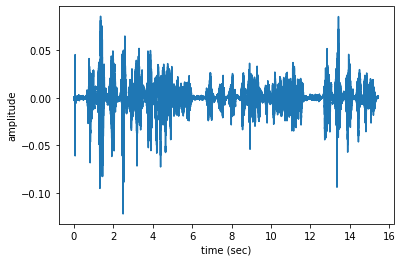

participant         s145
interpretation       hum
number                 1
song              potter
Name: s145_hum_1_potter.wav, dtype: object


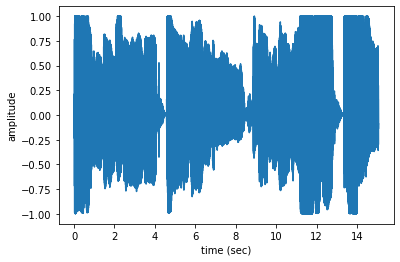

participant          s153
interpretation    whistle
number                  2
song               potter
Name: s153_whistle_2_potter.wav, dtype: object


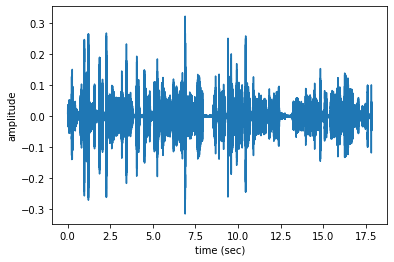

In [ ]:
for _ in range(3):
  # generate a random index number
  n = np.random.randint(len(files))
  fs = None 
  x, fs = librosa.load(files[n],sr=fs)
  t = np.arange(len(x))/fs
  plt.plot(t,x)
  plt.xlabel('time (sec)')
  plt.ylabel('amplitude')

  # Note here we can acquire the attributes of the file in question using the following indexing rule
  print(MLENDHW_df.loc[files[n].split('/')[-1]])

  plt.show()

File lists and dataframes for subsets of the hum and whistle data containing strictly `hum` and `whistle` recordings are created here for experiments 2  and 3 later on. These datasets are subsets of the "hums and whistles" dataset.

In [ ]:
# Separate hums and whistles
files_hum = []
files_whistle = []

# Check the interpretation type of the filename
for file in files:
  if "hum" in file:
    files_hum.append(file)
  elif "whistle" in file:
    files_whistle.append(file)

# This is the hum subset dataframe
MLENDHW_df_hum = MLENDHW_df.loc[MLENDHW_df['interpretation'] == 'hum']
print("Hum dataset files: {}".format(len(files_hum)))

# This is the whistle subset dataframe
MLENDHW_df_whistle = MLENDHW_df.loc[MLENDHW_df['interpretation'] == 'whistle']
print("Whistle dataset files: {}".format(len(files_whistle)))

Hum dataset files: 587
Whistle dataset files: 236


# 8 Results

## 8.1 Feature Extraction
The list of files has been split into 2 sub lists for hum and whistle interpretations. This allows for the easy extraction of all the features required.

In our experiments, we're going to test each model using 3 main datasets.

*   Hums and Whistles Combined
*   Hums only
*   Whistles only

We do this to see if our classification models perform better using certain interpretations. For each dataset, $X$ will be an array of the features we've extracted, and $y$ will be an array of the true labels for each song class.

As standard in this solution, $y$ will have the value `True` if the audioclip is labelled `potter` and `False` if the audioclip is labelled `starwars` 


### Hums and Whistles Dataset Feature Extraction

Here we'll extract the features features for our Hums and Whistles dataset.

In [ ]:
# Getting Features
print("Obtaining Features: \n")
X,y, bad_files = getXyFeatures(files, labels_file=MLENDHW_df, scale_audio=True, onlySingleDigit=True)
# Let's store these in a list that we can access later on
HWAudioFeatures = [X,y]

print("Number of files rejected by peak detection: ",len(bad_files))

# We print the length of X here - the number of audio files we collect.
print("Number of hum and whistle audio files: ", len(X))
# This will print the labels "True" or "False" for our condition: "Is this file a potter recording? - True/False"
print('The labels vector is', y)

Obtaining Features: 



100%|██████████| 823/823 [14:17<00:00,  1.04s/it]

Number of files rejected by peak detection:  49
Number of hum and whistle audio files:  774
The labels vector is ['potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' '

Now that we've obtained our features, let's look at the "peak" features in particular for a given file. We will be using the first 20 peak locations in order to classify our songs. Let's load a file, extract it's peaks using librosa and then plot them:

Average distance between peaks in this sample:  68.66666666666667
participant           s104
interpretation         hum
number                   3
song              starwars
Name: s104_hum_3_starwars.wav, dtype: object


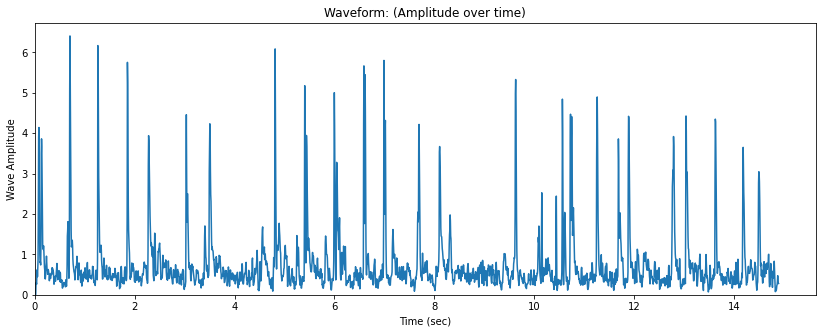

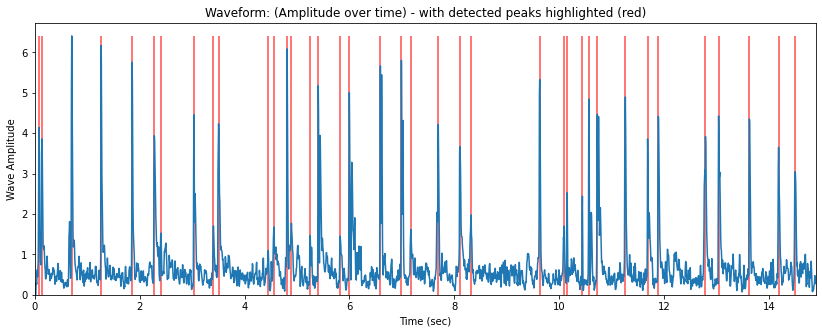

In [ ]:
fs = None 
x, fs = librosa.load(files[601],sr=fs)

hop_length = 256
onset_envelope = librosa.onset.onset_strength(x, sr=fs, hop_length=hop_length)

N = len(x)
T = N/float(fs)
t = np.linspace(0, T, len(onset_envelope))

peak_frames = librosa.util.peak_pick(onset_envelope, 7, 7, 7, 7, 0.5, 5)

plt.figure(figsize=(14, 5))
plt.plot(t, onset_envelope)
plt.xlabel('Time (sec)')
plt.ylabel('Wave Amplitude')
plt.title("Waveform: (Amplitude over time)")
plt.xlim(xmin=0)
plt.ylim(0)

peak_distances = []

for i, val in enumerate(peak_frames):
        if i > 1:
          distance = peak_frames[i] - peak_frames[i-1]
          peak_distances.append(distance)

avg_peaktopeak_distance = sum(peak_distances) / len(peak_distances)
print("Average distance between peaks in this sample: ",avg_peaktopeak_distance)


plt.figure(figsize=(14, 5))
plt.plot(t, onset_envelope)
plt.grid(False)
plt.vlines(t[peak_frames], 0, onset_envelope.max(), color='r', alpha=0.7)
plt.xlabel('Time (sec)')
plt.ylabel('Wave Amplitude')
plt.title("Waveform: (Amplitude over time) - with detected peaks highlighted (red)")
plt.xlim(0, T)
plt.ylim(0)

print(MLENDHW_df.loc[files[601].split('/')[-1]])

### Hums Dataset Feature Extraction

Here we'll extract the features for our Hums dataset.

In [ ]:
# Getting Features
print("Obtaining Features: \n")
X,y, bad_files = getXyFeatures(files_hum, labels_file=MLENDHW_df_hum, scale_audio=True, onlySingleDigit=True)
# Let's store these in a list that we can access later on
HAudioFeatures = [X,y]

print("Number of files with unsuitable peak detection: ",len(bad_files))

# We print the length of X here, as it's simply the number of audio files we collect.
print("Number of hum and whistle audio files: ", len(X))

# We print the length of X here, as it's simply the number of audio files we collect.
print("Number of hum audio files: ", len(X))
# This will print the labels "True" or "False" for our condition: "Is this file a potter recording? - True/False"
print('The hum labels vector is', y)

Obtaining Features: 



100%|██████████| 587/587 [07:35<00:00,  1.29it/s]

Number of files with unsuitable peak detection:  21
Number of hum and whistle audio files:  566
Number of hum audio files:  566
The hum labels vector is ['potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter

### Whistles Dataset Feature Extraction

Here we'll extract the features for our Whistles dataset.

In [ ]:
# Getting Features
print("Obtaining Features: \n")
X,y, bad_files = getXyFeatures(files_whistle, labels_file=MLENDHW_df_whistle, scale_audio=True, onlySingleDigit=True)
# Let's store these in a list that we can access later on
WAudioFeatures = [X,y]

print("Number of files with unsuitable peak detection: ",len(bad_files))

# We print the length of X here, as it's simply the number of audio files we collect.
print("Number of whistle audio files: ", len(X))
# This will print the labels "True" or "False" for our condition: "Is this file a potter recording? - True/False"
print('The whistle labels vector is', y)

Obtaining Features: 



100%|██████████| 236/236 [03:03<00:00,  1.29it/s]

Number of files with unsuitable peak detection:  28
Number of whistle audio files:  208
The whistle labels vector is ['potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter' 'potter'
 'potte

## Experiment 1: Classification using Hums AND Whistles.


### Experiment 1.1: Hums and Whistles

Let's import our models from sklearn, then split the hum and whistle data into training and testing sets, using 30% of our data for model validation. This means we train our model using 70% of the data available to us. 

In [ ]:
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate

X = HWAudioFeatures[0]
y = HWAudioFeatures[1]

X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((541, 17), (233, 17), (541,), (233,))

Let's now normalise our data by calculating the z-scores. We do this by calculaing the z-score for each attribute, so no one attribute can bias the model. i.e. all attributes are put on to a standard scale. We can interpret the z-score as a measure of "how many standard deviations a data point is from the mean", with a z-score of $0$ being the mean value of the feature. 

In [ ]:
# Standardisation (z-score normalisation)
mean = X_train.mean(0)
sd =  X_train.std(0)
X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

Now let's run our models over the data, and check the evaluation metrics:

In [ ]:
SVM_results, KNN_results, LR_results = testModels(X_train,X_val,y_train,y_val)


 Support Vector Machine
Best hyperparameter setting: SVC(C=2).
Average training accuracy across folds of best hyperparameter setting: 1.
Test dataset accuracy of best hyperparameter setting: 0.73.
SVM Score (Validation Accuracy):  0.73

 K Nearest Neighbours
Best hyperparameter setting: KNeighborsClassifier(n_neighbors=4).
Average training accuracy across folds of best hyperparameter setting: 0.656.
Test dataset accuracy of best hyperparameter setting: 0.635.
KNN Score (Validation Accuracy):  0.635

 Logistic Regression
Best hyperparameter setting: LogisticRegression().
Average training accuracy across folds of best hyperparameter setting: 0.649.
Test dataset accuracy of best hyperparameter setting: 0.738.
LR Score (Validation Accuracy):  0.738


Let's take a look at our selected models, and how they performed on the hums and whistles dataset.


 Support Vector Machine Summary
Training Accuracy 0.7098
Validation  Accuracy 0.7296


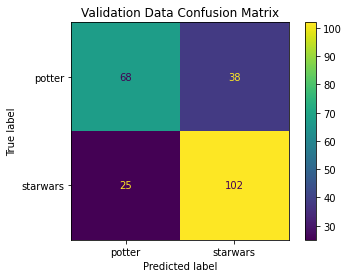


 K Nearest Neighbours Summary
Training Accuracy 0.7948
Validation  Accuracy 0.6352


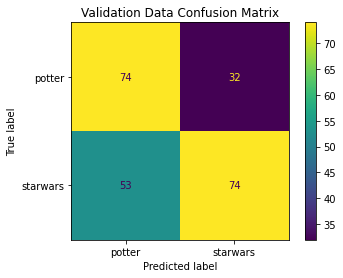


 Logistic Regression Summary
Training Accuracy 0.6599
Validation  Accuracy 0.7382


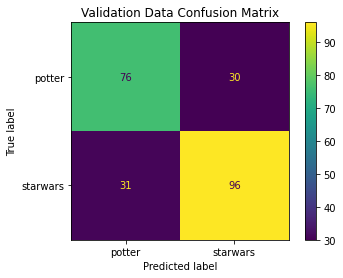

In [ ]:
# SVM
print("\n Support Vector Machine Summary")
print("=================================")
_, svm_va = getModelAccuracies(SVM_results[1], SVM_results[2], y_train, y_val)
getModelConfusionMatrix(SVM_results[2], y_val)

#KNN
print("\n K Nearest Neighbours Summary")
print("===============================")
_, knn_va = getModelAccuracies(KNN_results[1], KNN_results[2], y_train, y_val)
getModelConfusionMatrix(KNN_results[2], y_val)

#LR
print("\n Logistic Regression Summary")
print("==============================")
_, lr_va = getModelAccuracies(LR_results[1], LR_results[2], y_train, y_val)
getModelConfusionMatrix(LR_results[2], y_val)

# We'll save all the Models and their accuracies for this experiment here.
Experiment_1_Models = []
Experiment_1_Accuracies = []

# Let's save our results
Experiment_1_Models.append([SVM_results[0], KNN_results[0], LR_results[0]])
Experiment_1_Accuracies.append([svm_va, knn_va, lr_va])

Looking at the confusion matrices generated, we can see that the top left to bottom right diagonals in each case have the highest value, indicating that the models are more likely to predict correctly than not. The number of mislabels is quite high however in each case, as shown by the darker coloured squares in the bottom left and top right. We can see in each case that there seems to be a slight tendency in each case to mislabel "starwars" as potter.

Now we'll use the best model as our CHOSEN pipeline model, run it, and provide the outputs.

In [ ]:
models = [SVM_results[0], KNN_results[0], LR_results[0]]
scores = [SVM_results[3], KNN_results[3], LR_results[3]]

# Get the model with the best score for our pipeline
print(scores)
max_score = max(scores)
max_score_index = scores.index(max_score)
model = models[max_score_index]

model_predictions = model.predict(X_val)
model_accuracy = model.score(X_val, y_val)

print("Our pipeline's chosen model was: ",model)
print("Its accuracy score on our validation set was: ",model_accuracy)

# Get the results for what model we will use in pipeline 1
pipeline_1_components = [model, model_predictions, model_accuracy]

[0.7296137339055794, 0.6351931330472103, 0.7381974248927039]
Our pipeline's chosen model was:  LogisticRegression()
Its accuracy score on our validation set was:  0.7381974248927039


### Experiment 1.2 Hums and Whistles with Outliers removed using z-score

Here we will remove outliers using the z-score of each feature. We can remove the outliers after we have performed the z-score normalisation step. We do this by removing any values with a z-score greater than 3. A good way to interpret this process, is that we are removing any data points that are more than 3 standard deviations away from the mean value. We use a score of 3 as this is the standard number used in z-score outlier removal.

This time, we'll remove outliers using our z-score method before splitting our training and testing data. Note that our z-score algorithm will also normalise the values of $X$ for us.

In [ ]:
zscore_threshold = 3
X_outliers_removed, y_outliers_removed = removeOutliers(X, y, zscore_threshold)

47  outliers removed.


Use our outlier-removed datasets on our models again, and see what has changed.

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_outliers_removed,y_outliers_removed,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

((508, 17), (219, 17), (508,), (219,))

Run the model test to find the best models

In [ ]:
SVM_results, KNN_results, LR_results = testModels(X_train,X_val,y_train,y_val)


 Support Vector Machine
Best hyperparameter setting: SVC(C=7).
Average training accuracy across folds of best hyperparameter setting: 1.
Test dataset accuracy of best hyperparameter setting: 0.685.
SVM Score (Validation Accuracy):  0.685

 K Nearest Neighbours
Best hyperparameter setting: KNeighborsClassifier(n_neighbors=9).
Average training accuracy across folds of best hyperparameter setting: 0.673.
Test dataset accuracy of best hyperparameter setting: 0.635.
KNN Score (Validation Accuracy):  0.635

 Logistic Regression
Best hyperparameter setting: LogisticRegression(C=0.1).
Average training accuracy across folds of best hyperparameter setting: 0.691.
Test dataset accuracy of best hyperparameter setting: 0.635.
LR Score (Validation Accuracy):  0.635



 Support Vector Machine Summary
Training Accuracy 0.8031
Validation  Accuracy 0.6849


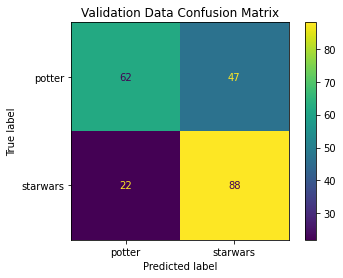


 K Nearest Neighbours Summary
Training Accuracy 0.7657
Validation  Accuracy 0.6347


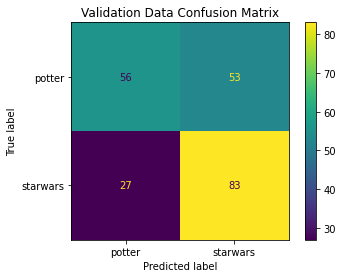


 Logistic Regression Summary
Training Accuracy 0.7028
Validation  Accuracy 0.6347


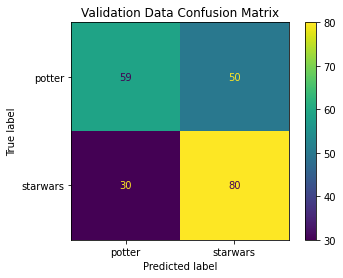

In [ ]:
# SVM
print("\n Support Vector Machine Summary")
print("=================================")
_, svm_va = getModelAccuracies(SVM_results[1], SVM_results[2], y_train, y_val)
getModelConfusionMatrix(SVM_results[2], y_val)

#KNN
print("\n K Nearest Neighbours Summary")
print("===============================")
_, knn_va = getModelAccuracies(KNN_results[1], KNN_results[2], y_train, y_val)
getModelConfusionMatrix(KNN_results[2], y_val)

#LR
print("\n Logistic Regression Summary")
print("==============================")
_, lr_va = getModelAccuracies(LR_results[1], LR_results[2], y_train, y_val)
getModelConfusionMatrix(LR_results[2], y_val)

# Let's save our results
Experiment_1_Models.append([SVM_results[0], KNN_results[0], LR_results[0]])
Experiment_1_Accuracies.append([svm_va, knn_va, lr_va])

Looking at the confusion marices here, it appears that in each case, there is a high tendency for each model to mislabel "potter" as "starwars", as indicated by the top right square of each matrix. We also see that in each case, the models are biased towards correctly classifying "starwars", as there are much fewer misclassifications in this case, and a larger number of correct "starwars" classifications. One potential cause for this is that there may be many more "starwars" audioclips in our training data than "potter" audioclips, biasing the model when training it.

Run the best model

In [ ]:
models = [SVM_results[0], KNN_results[0], LR_results[0]]
scores = [SVM_results[3], KNN_results[3], LR_results[3]]

# Get the model with the best score for our pipeline
print(scores)
max_score = max(scores)
max_score_index = scores.index(max_score)
model = models[max_score_index]

model_predictions = model.predict(X_val)
model_accuracy = model.score(X_val, y_val)

print("Our pipeline's chosen model was: ",model)
print("Its accuracy score on our validation set was: ",model_accuracy)

# Get the results for what model we will use in pipeline 2
pipeline_2_components = [model, model_predictions, model_accuracy]

[0.684931506849315, 0.634703196347032, 0.634703196347032]
Our pipeline's chosen model was:  SVC(C=7)
Its accuracy score on our validation set was:  0.684931506849315


#### As Experiments 2 and 3 run the same code as Experiment 1 - this time with different datasets, I won't go through the code as thoroughly as there are no changes. We're simply testing the effect different data has on our models.

## Experiment 2: Classification using only Hums.

### Experiment 2.1: Hums only

Select the hum dataset, and run the experiment again

In [ ]:
X = HAudioFeatures[0]
y = HAudioFeatures[1]


 Support Vector Machine
Best hyperparameter setting: SVC(C=8).
Average training accuracy across folds of best hyperparameter setting: 1.
Test dataset accuracy of best hyperparameter setting: 0.706.
SVM Score (Validation Accuracy):  0.706

 K Nearest Neighbours
Best hyperparameter setting: KNeighborsClassifier(n_neighbors=6).
Average training accuracy across folds of best hyperparameter setting: 0.669.
Test dataset accuracy of best hyperparameter setting: 0.676.
KNN Score (Validation Accuracy):  0.676

 Logistic Regression
Best hyperparameter setting: LogisticRegression(C=10).
Average training accuracy across folds of best hyperparameter setting: 0.659.
Test dataset accuracy of best hyperparameter setting: 0.676.
LR Score (Validation Accuracy):  0.676

 Support Vector Machine Summary
Training Accuracy 0.7904
Validation  Accuracy 0.7059


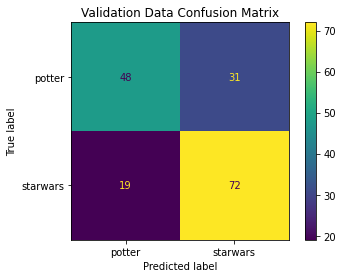


 K Nearest Neighbours Summary
Training Accuracy 0.7753
Validation  Accuracy 0.6765


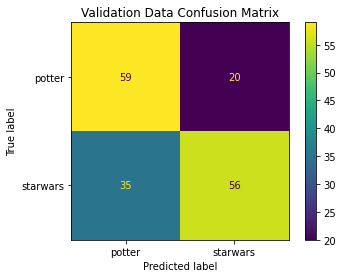


 Logistic Regression Summary
Training Accuracy 0.6869
Validation  Accuracy 0.6765


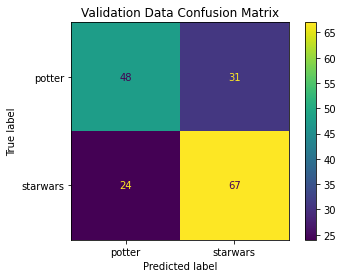

In [ ]:
# Train/Validate Split
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

# Standardisation (z-score normalisation)
mean = X_train.mean(0)
sd =  X_train.std(0)
X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

# Run the models and find the best ones
SVM_results, KNN_results, LR_results = testModels(X_train,X_val,y_train,y_val)

# Print and save our results:
# SVM
print("\n Support Vector Machine Summary")
print("=================================")
_, svm_va = getModelAccuracies(SVM_results[1], SVM_results[2], y_train, y_val)
getModelConfusionMatrix(SVM_results[2], y_val)

#KNN
print("\n K Nearest Neighbours Summary")
print("===============================")
_, knn_va = getModelAccuracies(KNN_results[1], KNN_results[2], y_train, y_val)
getModelConfusionMatrix(KNN_results[2], y_val)

#LR
print("\n Logistic Regression Summary")
print("==============================")
_, lr_va = getModelAccuracies(LR_results[1], LR_results[2], y_train, y_val)
getModelConfusionMatrix(LR_results[2], y_val)

Experiment_2_Models = []
Experiment_2_Accuracies = []

# Let's save our results
Experiment_2_Models.append([SVM_results[0], KNN_results[0], LR_results[0]])
Experiment_2_Accuracies.append([svm_va, knn_va, lr_va])

Similar to the previous experiment, it appears that in each case, there is a high tendency for each model to mislabel "potter" as "starwars", as indicated by the top right square of each matrix. We also see that in each case, again, the models are biased towards correctly classifying "starwars", as there are much fewer misclassifications. One potential cause for this could be that there are some audio files in our training data that are mislabelled as "potter", when the audio file actually contains a clip of "starwars".

In [ ]:
models = [SVM_results[0], KNN_results[0], LR_results[0]]
scores = [SVM_results[3], KNN_results[3], LR_results[3]]

# Get the model with the best score for our pipeline
print(scores)
max_score = max(scores)
max_score_index = scores.index(max_score)
model = models[max_score_index]

model_predictions = model.predict(X_val)
model_accuracy = model.score(X_val, y_val)

print("Our pipeline's chosen model was: ",model)
print("Its accuracy score on our validation set was: ",model_accuracy)

# Get the results for what model we will use in pipeline 3
pipeline_3_components = [model, model_predictions, model_accuracy]

[0.7058823529411765, 0.6764705882352942, 0.6764705882352942]
Our pipeline's chosen model was:  SVC(C=8)
Its accuracy score on our validation set was:  0.7058823529411765


### Experiment 2.2: Hums with outliers removed using z-score

28  outliers removed.

 Support Vector Machine
Best hyperparameter setting: SVC(C=7).
Average training accuracy across folds of best hyperparameter setting: 1.
Test dataset accuracy of best hyperparameter setting: 0.685.
SVM Score (Validation Accuracy):  0.685

 K Nearest Neighbours
Best hyperparameter setting: KNeighborsClassifier(n_neighbors=4).
Average training accuracy across folds of best hyperparameter setting: 0.694.
Test dataset accuracy of best hyperparameter setting: 0.685.
KNN Score (Validation Accuracy):  0.685

 Logistic Regression
Best hyperparameter setting: LogisticRegression(C=10).
Average training accuracy across folds of best hyperparameter setting: 0.705.
Test dataset accuracy of best hyperparameter setting: 0.66.
LR Score (Validation Accuracy):  0.66

 Support Vector Machine Summary
Training Accuracy 0.8138
Validation  Accuracy 0.6852


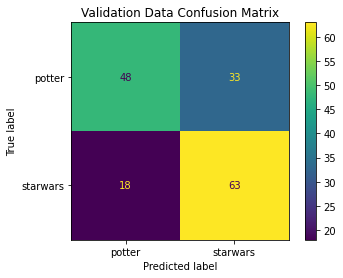


 K Nearest Neighbours Summary
Training Accuracy 0.7846
Validation  Accuracy 0.6852


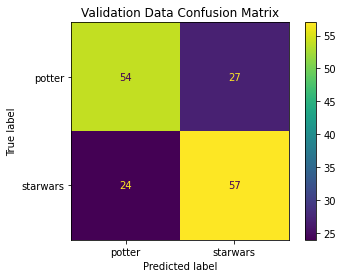


 Logistic Regression Summary
Training Accuracy 0.7101
Validation  Accuracy 0.6605


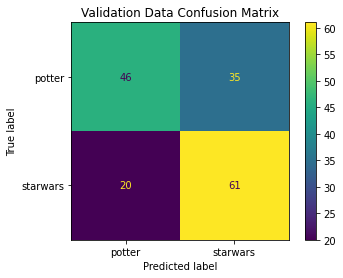

In [ ]:
# Remove outliers using z-score
zscore_threshold = 3
X_outliers_removed, y_outliers_removed = removeOutliers(X, y, zscore_threshold)

#Train/Validate split
X_train, X_val, y_train, y_val = train_test_split(X_outliers_removed,y_outliers_removed,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

# Run our models
SVM_results, KNN_results, LR_results = testModels(X_train,X_val,y_train,y_val)

# SVM
print("\n Support Vector Machine Summary")
print("=================================")
_, svm_va = getModelAccuracies(SVM_results[1], SVM_results[2], y_train, y_val)
getModelConfusionMatrix(SVM_results[2], y_val)

#KNN
print("\n K Nearest Neighbours Summary")
print("===============================")
_, knn_va = getModelAccuracies(KNN_results[1], KNN_results[2], y_train, y_val)
getModelConfusionMatrix(KNN_results[2], y_val)

#LR
print("\n Logistic Regression Summary")
print("==============================")
_, lr_va = getModelAccuracies(LR_results[1], LR_results[2], y_train, y_val)
getModelConfusionMatrix(LR_results[2], y_val)

# Let's save our results
Experiment_2_Models.append([SVM_results[0], KNN_results[0], LR_results[0]])
Experiment_2_Accuracies.append([svm_va, knn_va, lr_va])

In the confusion matrices presented here, we note that the misclassifications shown (bottom right, top left squares) are much more balanced than before, witout z-score outliers removed. Again, it appears that the algorithm is biased towards classifying "starwars" correctly. 

In [ ]:
models = [SVM_results[0], KNN_results[0], LR_results[0]]
scores = [SVM_results[3], KNN_results[3], LR_results[3]]

# Get the model with the best score for our pipeline
print(scores)
max_score = max(scores)
max_score_index = scores.index(max_score)
model = models[max_score_index]

model_predictions = model.predict(X_val)
model_accuracy = model.score(X_val, y_val)

print("Our pipeline's chosen model was: ",model)
print("Its accuracy score on our validation set was: ",model_accuracy)

# Get the results for what model we will use in pipeline 4
pipeline_4_components = [model, model_predictions, model_accuracy]

[0.6851851851851852, 0.6851851851851852, 0.6604938271604939]
Our pipeline's chosen model was:  SVC(C=7)
Its accuracy score on our validation set was:  0.6851851851851852


## Experiment 3: Classification using only Whistles.

### Experiment 3.1: Whistles

Select whistle data

In [ ]:
X = WAudioFeatures[0]
y = WAudioFeatures[1]


 Support Vector Machine
Best hyperparameter setting: SVC(C=2).
Average training accuracy across folds of best hyperparameter setting: 1.
Test dataset accuracy of best hyperparameter setting: 0.683.
SVM Score (Validation Accuracy):  0.683

 K Nearest Neighbours
Best hyperparameter setting: KNeighborsClassifier().
Average training accuracy across folds of best hyperparameter setting: 0.614.
Test dataset accuracy of best hyperparameter setting: 0.635.
KNN Score (Validation Accuracy):  0.635

 Logistic Regression


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


Best hyperparameter setting: LogisticRegression().
Average training accuracy across folds of best hyperparameter setting: 0.69.
Test dataset accuracy of best hyperparameter setting: 0.651.
LR Score (Validation Accuracy):  0.651

 Support Vector Machine Summary
Training Accuracy 0.8
Validation  Accuracy 0.6825


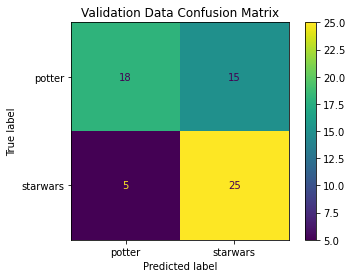


 K Nearest Neighbours Summary
Training Accuracy 0.7379
Validation  Accuracy 0.6349


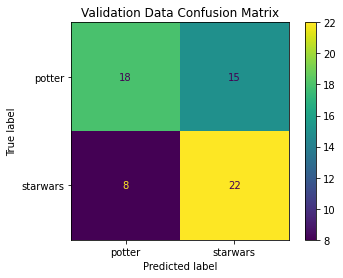


 Logistic Regression Summary
Training Accuracy 0.7034
Validation  Accuracy 0.6508


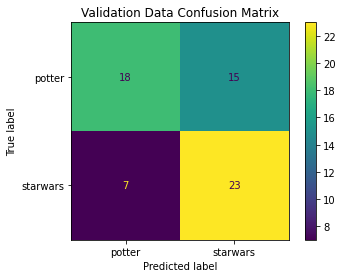

In [ ]:
# Train/Validate split
X_train, X_val, y_train, y_val = train_test_split(X,y,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

# Standardisation (z-score normalisation)
mean = X_train.mean(0)
sd =  X_train.std(0)
X_train = (X_train-mean)/sd
X_val  = (X_val-mean)/sd

# Run our models
SVM_results, KNN_results, LR_results = testModels(X_train,X_val,y_train,y_val)

# Print and save our results
# SVM
print("\n Support Vector Machine Summary")
print("=================================")
_, svm_va = getModelAccuracies(SVM_results[1], SVM_results[2], y_train, y_val)
getModelConfusionMatrix(SVM_results[2], y_val)

#KNN
print("\n K Nearest Neighbours Summary")
print("===============================")
_, knn_va = getModelAccuracies(KNN_results[1], KNN_results[2], y_train, y_val)
getModelConfusionMatrix(KNN_results[2], y_val)

#LR
print("\n Logistic Regression Summary")
print("==============================")
_, lr_va = getModelAccuracies(LR_results[1], LR_results[2], y_train, y_val)
getModelConfusionMatrix(LR_results[2], y_val)

Experiment_3_Models = []
Experiment_3_Accuracies = []

# Let's save our results
Experiment_3_Models.append([SVM_results[0], KNN_results[0], LR_results[0]])
Experiment_3_Accuracies.append([svm_va, knn_va, lr_va])

The confusion matrices here indicate that we have a much poorer classification rate for each of our models than previous experiments. Looking at some squares, the correctly predicted count (as shown in the top left and bottom right matrix squares) is almost the same value - if not less in some cases - than the number of incorrect predictions (bottom left, top right). This is reinforced by the colours of the squares being similar. Correct classifications of "starwars" stands out as being particularly well classified be our models, and may be the reason that the overall validation accuracy for each model is still reasonably high, despite poor "potter" classifications. Again, this might suggest our training data is heavily "starwars" biased, and that the model is better suited to classifying this song than "potter".

In [ ]:
models = [SVM_results[0], KNN_results[0], LR_results[0]]
scores = [SVM_results[3], KNN_results[3], LR_results[3]]

# Get the model with the best score for our pipeline
print(scores)
max_score = max(scores)
max_score_index = scores.index(max_score)
model = models[max_score_index]

model_predictions = model.predict(X_val)
model_accuracy = model.score(X_val, y_val)

print("Our pipeline's chosen model was: ",model)
print("Its accuracy score on our validation set was: ",model_accuracy)

# Get the results for what model we will use in pipeline 5
pipeline_5_components = [model, model_predictions, model_accuracy]

[0.6825396825396826, 0.6349206349206349, 0.6507936507936508]
Our pipeline's chosen model was:  SVC(C=2)
Its accuracy score on our validation set was:  0.6825396825396826


### Experiment 3.2: Whistles with outliers removed using z-score

12  outliers removed.

 Support Vector Machine
Best hyperparameter setting: SVC(C=1).
Average training accuracy across folds of best hyperparameter setting: 1.
Test dataset accuracy of best hyperparameter setting: 0.712.
SVM Score (Validation Accuracy):  0.712

 K Nearest Neighbours
Best hyperparameter setting: KNeighborsClassifier().
Average training accuracy across folds of best hyperparameter setting: 0.628.
Test dataset accuracy of best hyperparameter setting: 0.627.
KNN Score (Validation Accuracy):  0.627

 Logistic Regression
Best hyperparameter setting: LogisticRegression().
Average training accuracy across folds of best hyperparameter setting: 0.649.
Test dataset accuracy of best hyperparameter setting: 0.712.
LR Score (Validation Accuracy):  0.712

 Support Vector Machine Summary
Training Accuracy 0.7445
Validation  Accuracy 0.7119


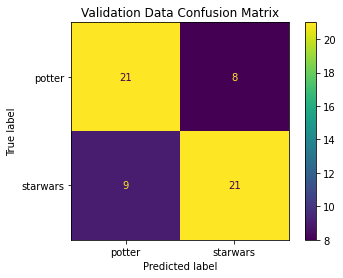


 K Nearest Neighbours Summary
Training Accuracy 0.7299
Validation  Accuracy 0.6271


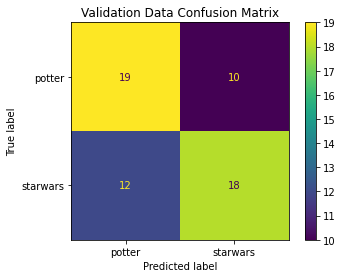


 Logistic Regression Summary
Training Accuracy 0.7007
Validation  Accuracy 0.7119


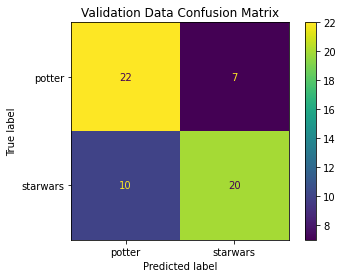

In [ ]:
zscore_threshold = 3
X_outliers_removed, y_outliers_removed = removeOutliers(X, y, zscore_threshold)

X_train, X_val, y_train, y_val = train_test_split(X_outliers_removed,y_outliers_removed,test_size=0.3)
X_train.shape, X_val.shape, y_train.shape, y_val.shape

SVM_results, KNN_results, LR_results = testModels(X_train,X_val,y_train,y_val)

# SVM
print("\n Support Vector Machine Summary")
print("=================================")
_, svm_va = getModelAccuracies(SVM_results[1], SVM_results[2], y_train, y_val)
getModelConfusionMatrix(SVM_results[2], y_val)

#KNN
print("\n K Nearest Neighbours Summary")
print("===============================")
_, knn_va = getModelAccuracies(KNN_results[1], KNN_results[2], y_train, y_val)
getModelConfusionMatrix(KNN_results[2], y_val)

#LR
print("\n Logistic Regression Summary")
print("==============================")
_, lr_va = getModelAccuracies(LR_results[1], LR_results[2], y_train, y_val)
getModelConfusionMatrix(LR_results[2], y_val)

# Let's save our results
Experiment_3_Models.append([SVM_results[0], KNN_results[0], LR_results[0]])
Experiment_3_Accuracies.append([svm_va, knn_va, lr_va])

Looking at the confusion matrices for this final experiment, we see that our model is somewhat balanced, and that removing outliers from the whistles dataset has improved overall. This might be because we have removed poor quality audioclips that are difficult to classify from our training data.

In [ ]:
models = [SVM_results[0], KNN_results[0], LR_results[0]]
scores = [SVM_results[3], KNN_results[3], LR_results[3]]

# Get the model with the best score for our pipeline
print(scores)
max_score = max(scores)
max_score_index = scores.index(max_score)
model = models[max_score_index]

model_predictions = model.predict(X_val)
model_accuracy = model.score(X_val, y_val)

print("Our pipeline's chosen model was: ",model)
print("Its accuracy score on our validation set was: ",model_accuracy)

# Get the results for what model we will use in pipeline 6
pipeline_6_components = [model, model_predictions, model_accuracy]

[0.711864406779661, 0.6271186440677966, 0.711864406779661]
Our pipeline's chosen model was:  SVC(C=1)
Its accuracy score on our validation set was:  0.711864406779661


# 9 Conclusions & Constructed Pipelines



## Experiment 1 Pipelines -  Hums and Whistles



### Normalised hums - final result:



In [ ]:
print("Best Model: ",pipeline_1_components[0])
print("Validation Accuracy: ",round(pipeline_1_components[2],3))

Best Model:  LogisticRegression()
Validation Accuracy:  0.738


Our resultant pipeline for this experiment is shown below, using the best model from our experiment.

Our input would be a list of filepaths to our `.wav` files, and the output would be our predictions for each file.




In [ ]:
def pipeline_1(list_of_filepaths):
  # Extract the features of the audio clips, X, and the files discarded, bad_files
  X, bad_files = getXFeatures(list_of_filepaths, scale_audio=True, onlySingleDigit=True)

  # Normalise our data by acquiring our z-scores
  X = getZscores(X)

  # Print out the discarded files (note enough peaks)
  print("{} files discarded from feature extraction step".format(len(bad_files)))

  # Get our trained best model from the experiment
  model = pipeline_1_output[0]

  # Generate our predictions using our trained model
  model_predictions = model.predict(X)

  return model_predictions

### Normalised hums and outliers removed final result:


In [ ]:
print("Best Model: ",pipeline_2_components[0])
print("Validation Accuracy: ",round(pipeline_2_components[2],3))

Best Model:  SVC(C=7)
Validation Accuracy:  0.685


Our resultant pipeline for this experiment is shown below, using the best model from our experiment.

Our input would be a list of filepaths to our `.wav` files, and the output would be our predictions for each file.



In [ ]:
def pipeline_2(list_of_filepaths):
  # Extract the features of the audio clips, X, and the files discarded, bad_files
  X, bad_files = getXFeatures(list_of_filepaths, scale_audio=True, onlySingleDigit=True)

  # Remove our outliers
  threshold = 3
  removeOutliers(X, threshold)

  # Print out the discarded files (note enough peaks)
  print("{} files discarded from feature extraction step".format(len(bad_files)))

  # Get our trained best model from the experiment
  model = pipeline_2_output[0]

  # Generate our predictions using our trained model
  model_predictions = model.predict(X)

  return model_predictions

## Experiment 2 Pipelines - Hums only

### Normalised hums - final result:

In [ ]:
print("Best Model: ",pipeline_3_components[0])
print("Validation Accuracy: ",round(pipeline_3_components[2],3))

Best Model:  SVC(C=8)
Validation Accuracy:  0.706


Our resultant pipeline for this experiment is shown below, using the best model from our experiment.

Our input would be a list of filepaths to our `.wav` files, and the output would be our predictions for each file.

In [ ]:
def pipeline_3(list_of_filepaths):
  # Extract the features of the audio clips, X, and the files discarded, bad_files
  X, bad_files = getXFeatures(list_of_filepaths, scale_audio=True, onlySingleDigit=True)

  # Normalise our data by acquiring our z-scores
  X = getZscores(X)

  # Print out the discarded files (note enough peaks)
  print("{} files discarded from feature extraction step".format(len(bad_files)))

  # Get our trained best model from the experiment
  model = pipeline_3_output[0]

  # Generate our predictions using our trained model
  model_predictions = model.predict(X)

  return model_predictions

### Normalised hums and outliers removed final result:


In [ ]:
print("Best Model: ",pipeline_4_components[0])
print("Validation Accuracy: ",round(pipeline_4_components[2],3))

Best Model:  SVC(C=7)
Validation Accuracy:  0.685


Our resultant pipeline for this experiment is shown below, using the best model from our experiment.
Our input would be a list of filepaths to our `.wav` files, and the output would be our predictions for each file.

In [ ]:
def pipeline_4(list_of_filepaths):
  # Extract the features of the audio clips, X, and the files discarded, bad_files
  X, bad_files = getXFeatures(list_of_filepaths, scale_audio=True, onlySingleDigit=True)

  # Remove our outliers
  threshold = 3
  removeOutliers(X, threshold)

  # Print out the discarded files (note enough peaks)
  print("{} files discarded from feature extraction step".format(len(bad_files)))

  # Get our trained best model from the experiment
  model = pipeline_4_output[0]

  # Generate our predictions using our trained model
  model_predictions = model.predict(X)

  return model_predictions

## Experiment 3 Pipelines - Whistles only 

### Normalised whistles - final result:




In [ ]:
print("Best Model: ",pipeline_5_components[0])
print("Validation Accuracy: ",round(pipeline_5_components[2],3))

Best Model:  SVC(C=2)
Validation Accuracy:  0.683



Our resultant pipeline for this experiment is shown below, using the best model from our experiment.
Our input would be a list of filepaths to our `.wav` files, and the output would be our predictions for each file.


In [ ]:
def pipeline_5(list_of_filepaths):
  # Extract the features of the audio clips, X, and the files discarded, bad_files
  X, bad_files = getXFeatures(list_of_filepaths, scale_audio=True, onlySingleDigit=True)

  # Normalise our data by acquiring our z-scores
  X = getZscores(X)

  # Print out the discarded files (note enough peaks)
  print("{} files discarded from feature extraction step".format(len(bad_files)))

  # Get our trained best model from the experiment
  model = pipeline_5_output[0]

  # Generate our predictions using our trained model
  model_predictions = model.predict(X)

  return model_predictions

### Normalised whistles and outliers removed final result:




In [ ]:
print("Best Model: ",pipeline_6_components[0])
print("Validation Accuracy: ",round(pipeline_6_components[2],3))

Best Model:  SVC(C=1)
Validation Accuracy:  0.712




Our resultant pipeline for this experiment is shown below, using the best model from our experiment.

Our input would be a list of filepaths to our `.wav` files, and the output would be our predictions for each file.


In [ ]:
def pipeline_6(list_of_filepaths):
  # Extract the features of the audio clips, X, and the files discarded, bad_files
  X, bad_files = getXFeatures(list_of_filepaths, scale_audio=True, onlySingleDigit=True)

  # Remove our outliers
  threshold = 3
  removeOutliers(X, threshold)

  # Print out the discarded files (note enough peaks)
  print("{} files discarded from feature extraction step".format(len(bad_files)))

  # Get our trained best model from the experiment
  model = pipeline_6_output[0]

  # Generate our predictions using our trained model
  model_predictions = model.predict(X)

  return model_predictions

## Experiments Summary:

The main thing we see from the results of these experiments is that the removal of outliers from the data seems to consistently result in a better validation accuracy for each model. This is likely due to the outlier removal step getting rid of any audio clips that have poor audio quality, or do not contain audio clips that can easily be determined as either belonging to the "potter" or "starwars" classes, even upon inspection from the user.

We also see that the most common 'best' model - i.e. the model with the best validation accuracy - is the SVM.


I believe the main influences on our accuracy scores are as follows: 

1. Audio clips may contain whistle audio when they are labelled as "hums". This could cause our hums only dataset to be contaminated with whistle audio. The reasoning behind the removal of z-score outliers here is that it may remove any whistle data that lies outside of the z-score range.

2. In terms of our "hums only" results, we have reduced the size of our dataset by removing all of the whistles data. This will result in less training data to use, and as a result a lower accuracy when tested on the validation data. In future we could compare the effect of splitting the datasets by setting the training datasets to be the same size.

3. In terms of our "whistles only" results, we have reduced the size of our dataset by removing all of the hums data. This will again result in less training data to use, and as a result a lower accuracy when tested on the validation data. In future we could compare the effect of splitting the datasets by setting the training datasets to be the same size.

4. It also appears accross the board that as we remove our outliers, we seem to be damaging the validation accuracy obtained from the dataset. While this may simply be the result of less data - it may also indicate that what we view as an "outlier" may not actually be an outlier. Reviewing the outlier removal step may be necessary here.


## Model performances

Let's load our saved results, so we can discuss them in our summary.



In [ ]:
# Load Experiment 1 results
svm1_ex1, knn1_ex1, lr1_ex1 = Experiment_1_Models[0][0], Experiment_1_Models[0][1], Experiment_1_Models[0][2]
a1_1_ex1, a2_1_ex1, a3_1_ex1 = Experiment_1_Accuracies[0][0], Experiment_1_Accuracies[0][1], Experiment_1_Accuracies[0][2]
svm2_ex1, knn2_ex1, lr2_ex1 = Experiment_1_Models[1][0], Experiment_1_Models[1][1], Experiment_1_Models[1][2]
a1_2_ex1, a2_2_ex1, a3_2_ex1 = Experiment_1_Accuracies[1][0], Experiment_1_Accuracies[1][1], Experiment_1_Accuracies[1][2]

# Load Experiment 2 results
svm1_ex2, knn1_ex2, lr1_ex2 = Experiment_2_Models[0][0], Experiment_2_Models[0][1], Experiment_2_Models[0][2]
a1_1_ex2, a2_1_ex2, a3_1_ex2 = Experiment_2_Accuracies[0][0], Experiment_2_Accuracies[0][1], Experiment_2_Accuracies[0][2]
svm2_ex2, knn2_ex2, lr2_ex2 = Experiment_2_Models[1][0], Experiment_2_Models[1][1], Experiment_2_Models[1][2]
a1_2_ex2, a2_2_ex2, a3_2_ex2 = Experiment_2_Accuracies[1][0], Experiment_2_Accuracies[1][1], Experiment_2_Accuracies[1][2]

# Load Experiment 3 results
svm1_ex3, knn1_ex3, lr1_ex3 = Experiment_3_Models[0][0], Experiment_3_Models[0][1], Experiment_3_Models[0][2]
a1_1_ex3, a2_1_ex3, a3_1_ex3 = Experiment_3_Accuracies[0][0], Experiment_3_Accuracies[0][1], Experiment_3_Accuracies[0][2]
svm2_ex3, knn2_ex3, lr2_ex3 = Experiment_3_Models[1][0], Experiment_3_Models[1][1], Experiment_3_Models[1][2]
a1_2_ex3, a2_2_ex3, a3_2_ex3 = Experiment_3_Accuracies[1][0], Experiment_3_Accuracies[1][1], Experiment_3_Accuracies[1][2]

### Support Vector Machine

In [ ]:
print("\nSupport Vector Machine without z-scores removed                               ", " Validation dataset accuracy")
print("=====================================================================          ", "=============================")
print("SVM model we used with hums and whistles:                    ",str(svm1_ex1), "         Accuracy:", str(a1_1_ex1) )
print("SVM model we used with hums only:                            ",str(svm1_ex2), "         Accuracy:", str(a1_1_ex2) )
print("SVM model we used with whistles only:                        ",str(svm1_ex3), "         Accuracy:", str(a1_1_ex3) )

print("\nSupport Vector Machine with outlier z-scores (z > 3) removed                 ", "  Validation dataset accuracy")
print("=====================================================================          ", "=============================")
print("SVM model we used with hums and whistles - outliers removed: ",str(svm2_ex1), "         Accuracy:", str(a1_2_ex1) )
print("SVM model we used with hums only - outliers removed:         ",str(svm2_ex2), "         Accuracy:", str(a1_2_ex2) )
print("SVM model we used with whistles only - outliers removed:     ",str(svm2_ex3), "         Accuracy:", str(a1_2_ex3) )


Support Vector Machine without z-scores removed                                 Validation dataset accuracy
=====================================================================           =============================
SVM model we used with hums and whistles:                     SVC(C=2)          Accuracy: 0.7296
SVM model we used with hums only:                             SVC(C=8)          Accuracy: 0.7059
SVM model we used with whistles only:                         SVC(C=2)          Accuracy: 0.6825

Support Vector Machine with outlier z-scores (z > 3) removed                    Validation dataset accuracy
=====================================================================           =============================
SVM model we used with hums and whistles - outliers removed:  SVC(C=7)          Accuracy: 0.6849
SVM model we used with hums only - outliers removed:          SVC(C=7)          Accuracy: 0.6852
SVM model we used with whistles only - outliers removed:      SVC(C=1)       

As we can see from above, it appears that the overall accuracy of the SVM model does not improve as expected when we remove outliers using the z-score method before splitting our data into training and validation sets. By removing outliers, we intend to discard data that may negatively influence the hyperplane generated by the support vectors, as one large outlying support vector can change it's location and orientation. These results may suggest that the outliers we are removing are not outliers, so a more careful approach to outlier detection may need to be taken.

We also see that across the board, our SVM accuracy tends to be better when using either the hum or the hum and whistle data. This would suggest that our SVM is optimised for distinguishing songs apart that are from hums. As we have more hums than whistles however (i.e, our datasets are not balanced), we would need to compare the accuracies of the same model used on the same size of hum and whistle data. This may be accomplished in further experiments. This could also be due to the fact that the hum and whistle, as well as the hum datasets are much larger than the whistle dataset.

### K-Nearest Neighbours

In [ ]:
print("\nK-Nearest Neighbours without z-scores removed                               ", "                              Validation dataset accuracy")
print("=================================================================================================         ", "=============================")
print("KNN model we used with hums and whistles:                    ",str(knn1_ex1), "         Accuracy:", str(a2_1_ex1) )
print("KNN model we used with hums only:                            ",str(knn1_ex2), "         Accuracy:", str(a2_1_ex2) )
print("KNN model we used with whistles only:                        ",str(knn1_ex3), "                      Accuracy:", str(a2_1_ex3) )

print("\nK-Nearest Neighbours with outlier z-scores (z > 3) removed                 ", "                               Validation dataset accuracy")
print("==================================================================================================        ", "=============================")
print("KNN model we used with hums and whistles - outliers removed: ",str(knn2_ex1), "         Accuracy:", str(a2_2_ex1) )
print("KNN model we used with hums only - outliers removed:         ",str(knn2_ex2), "         Accuracy:", str(a2_2_ex2) )
print("KNN model we used with whistles only - outliers removed:     ",str(knn2_ex3), "                      Accuracy:", str(a2_2_ex3) )


K-Nearest Neighbours without z-scores removed                                                              Validation dataset accuracy
=================================================================================================          =============================
KNN model we used with hums and whistles:                     KNeighborsClassifier(n_neighbors=4)          Accuracy: 0.6352
KNN model we used with hums only:                             KNeighborsClassifier(n_neighbors=6)          Accuracy: 0.6765
KNN model we used with whistles only:                         KNeighborsClassifier()                       Accuracy: 0.6349

K-Nearest Neighbours with outlier z-scores (z > 3) removed                                                 Validation dataset accuracy
==================================================================================================         =============================
KNN model we used with hums and whistles - outliers removed:  KNeighborsClassifier

Across the board, it appears that the k-nearest neighbours model maintains a consistent validation dataset accuracy of around 0.6-0.7, although less than the SVM algorithm. 

We also see here that the hum only dataset has a consistently higher validation dataset accuracy, suggesting that the quality and consistency of the hum-only dataset is much greater than that of the whistles dataset. This may be because whistling is typically more difficult than humming for humans, and as such it is easier to produce a high quality hum than a whistle. In the case of the KNN classifier, removing outliers using the z-score method does not appear to have a significant impact on our validation accuracy.

### Logistic Regression

In [ ]:
print("\nLogistic Regression without z-scores removed                               ", "                              Validation dataset accuracy")
print("=================================================================================================        ", "=============================")
print("LR model we used with hums and whistles:                    ",str(lr1_ex1), "                        Accuracy:", str(a3_1_ex1) )
print("LR model we used with hums only:                            ",str(lr1_ex2), "                    Accuracy:", str(a3_1_ex2) )
print("LR model we used with whistles only:                        ",str(lr1_ex3), "                        Accuracy:", str(a3_1_ex3) )

print("\nLogistic Regression with outlier z-scores (z > 3) removed                 ", "                               Validation dataset accuracy")
print("==================================================================================================       ", "=============================")
print("LR model we used with hums and whistles - outliers removed: ",str(lr2_ex1), "                   Accuracy:", str(a3_2_ex1) )
print("LR model we used with hums only - outliers removed:         ",str(lr2_ex2), "                    Accuracy:", str(a3_2_ex2) )
print("LR model we used with whistles only - outliers removed:     ",str(lr2_ex3), "                        Accuracy:", str(a3_2_ex3) )


Logistic Regression without z-scores removed                                                              Validation dataset accuracy
=================================================================================================         =============================
LR model we used with hums and whistles:                     LogisticRegression()                         Accuracy: 0.7382
LR model we used with hums only:                             LogisticRegression(C=10)                     Accuracy: 0.6765
LR model we used with whistles only:                         LogisticRegression()                         Accuracy: 0.6508

Logistic Regression with outlier z-scores (z > 3) removed                                                 Validation dataset accuracy
==================================================================================================        =============================
LR model we used with hums and whistles - outliers removed:  LogisticRegression(C=0.1)   

The accuracy of the logistic regression across all datasets seems to vary, as different accuracies are produced for each experiment. There is no clear difference in the removal of outliers when each of the 3 datasets are compared by validation accuracy for the logistic regression model. 

## Considerations for further work

I believe in order to attain better model accuracies, it would be best to spend more time on how we extract our onset peaks from each audio clip. In our algorithm we essentially compare the time position of the first 15 peaks in each recording. We also extract the average distance between peaks in a recording. If we take a look at our feature extraction steps above, we see that we discard a number of "bad files" - these are audio clips that have less than 15 detected peaks. If we more carefully set the criteria for what a "peak" is - we may be able to increase the amount of audio data we retain in this step, and in theory produce better accuracies across the board for each of our models.

Another step that should be considered is improving the data preprocessing step. One possible reason for poor accuracies is the presence of mis-labelled data in the dataset (i.e. an audioclip of "starwars" that is labelled as "potter"). By rigorously checking that the data we use to train our models is accurately labelled, the better the accuracy of the resulting trained models will be.

As we are working with audio data, one other step that may improve the results of the classifiers tested in this project would be to reduce noise (noise being irrelevant features of the audioclip, i.e. static, beckground noise) in the audioclips. This would make "notes" in the song much more discernable from background noise, which should lead to a better tempo and "onset" ("onset being librosa's predictions of what part of a wave is the start of a "note") predictions.

Finally, a dataset that has equally as many hums as it does whistles would for a more direct comparison between how hums and whistles as independant datasets affect the training of our models.

# References


**Onset/Peak feature extraction code:**                                     
https://musicinformationretrieval.com/evaluation_onset.html
https://librosa.org/doc/main/generated/librosa.onset.onset_detect.html
http://www.eecs.qmul.ac.uk/former/people/jbc/Documents/Bello-TSAP-2005.pdf

**SVM Cost parameter reference:**     
https://stats.stackexchange.com/questions/225409/what-does-the-cost-c-parameter-mean-in-svm

